Our dataset source can be found at <a href="https://www.kaggle.com/iabhishekofficial/mobile-price-classification" target="_blank">this link</a>.

# Mobile Price Classification

<h1>Table of Content<span class="tocSkip"></span></h1>
<div class="toc">
    <ul class="toc-item"><li><span><a href="#A_presentation of_the problem" data-toc-modified-id="A_presentation_of_the_problem-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>A_presentation_of_the_problem</a></span>
        <ul class="toc-item"><li><span><a href="#Load_Data" data-toc-modified-id="Load_Data-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Load_Data</a></span></li>
            <li><span><a href="#Data_Analysis" data-toc-modified-id="Data_Analysis-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Data_Analysis</a></span></li>
            <li><span><a href="#Feature_Importance" data-toc-modified-id="Feature_Importance-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Feature_Importance</a></span></li>
            <li><span><a href="#PCA" data-toc-modified-id="PCA-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>PCA</a></span></li></ul></li>
        <li><span><a href="#A presentation of 5 challenger models" data-toc-modified-id="A presentation of 5 challenger models-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>A presentation of 5 challenger models</a></span>
            <ul class="toc-item"><li><span><a href="#XGBOOST" data-toc-modified-id="XGBOOST-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>XGBOOST</a></span></li>
                <li><span><a href="#Benchmark_Logistic_Regression_Model" data-toc-modified-id="Benchmark_Logistic_Regression_Model-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Benchmark_Logistic_Regression_Model</a></span></li>
                <li><span><a href="#Criteria" data-toc-modified-id="Criteria-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Criteria</a></span></li>
                <li><span><a href="#Gradient_Boosting" data-toc-modified-id="Gradient_Boosting-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Gradient_Boosting</a></span></li>
                <li><span><a href="#Building_Decision_Tree_Model" data-toc-modified-id="Building_Decision_Tree_Model-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Building_Decision_Tree_Model</a></span></li>
                <li><span><a href="#Random_Tree_Model" data-toc-modified-id="Random_Tree_Model-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>Random_Tree_Model</a></span></li></ul></li></ul></div>

# A_presentation_of_the_problem

Price is the most effective attribute of marketing and business. The very first question of consumer is about the price of items. Mobile nowadays is one of the most selling and purchasing devices. Every day new mobiles with new version and more features are launched.Hundreds and thousands of mobile are sold and purchased on daily basis. So here the mobile price classification is a case study for a given type of problem. 
#### AIM:
* In this Project,On the basis of the mobile Specifications like Battery power, 3G enabled , wifi ,Bluetooth, Ram etc., we are predicting Price range of the mobile


* In this data:
    * id:ID
    * battery_power:Total energy a battery can store in one time measured in mAh
    * blue:Has bluetooth or not
    * clock_speed:speed at which microprocessor executes instructions
    * dual_sim:Has dual sim support or not
    * fc:Front Camera mega pixels
    * four_g:Has 4G or not
    * int_memory:Internal Memory in Gigabytes
    * m_dep:Mobile Depth in cm
    * mobile_wt:Weight of mobile phone
    * n_cores:Number of cores of processor
    * pc:Primary Camera mega pixels
    * px_height:Pixel Resolution Height
    * px_width:Pixel Resolution Width
    * ram:Random Access Memory in Megabytes
    * sc_h:Screen Height of mobile in cm
    * sc_w:Screen Width of mobile in cm
    * talk_time:longest time that a single battery charge will last when you are talking
    * three_g:Has 3G or not
    * touch_screen:Has touch screen or not
    * wifi:Has wifi or not

So we will use many of above mentioned features to classify whether the mobile would be *very economical, *economical, and *expensive or *very_ expensive. 

#### USE:

Based on the accuracy, the appropriate algorithm has been used to predict the prices of the mobile phones.This not only helps the customers decide the right phone to purchase, it also helps the owners decide what should be the appropriate pricing of the phone for the features that they offer. This idea of predicting the price will help the people make informed choice when they are purchasing a phone in the future.

##### Applied Models:



* Gradient Boosting
* Logistic Regression
* XGBoost
* Decision tree
* Random forest

## Load_Data

In [1]:
pip install sns

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
dataset=pd.read_csv('train.csv')

In [3]:
test=pd.read_csv('test.csv')

In [4]:
dataset.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [5]:
print(dataset.columns)
print(test.columns)

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')
Index(['id', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc',
       'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')


## Data_Analysis

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Our target column is price range from train data. this column has 4 unique values, 0 for low cost mobile phone, 1 for medium cost mobile phone. 2 for high cost and 3 for very high cost. 

In [7]:
dataset['price_range'].unique()

array([1, 2, 3, 0], dtype=int64)

In [8]:
dataset.price_range.value_counts()

3    500
2    500
1    500
0    500
Name: price_range, dtype: int64

In [9]:
# 0 for low cost
# 1 for medium cost
# 2 for high cost
# 3 for very high cost

These are evenly distributed:
#blue:Has bluetooth or not
#dual_sim:Has dual sim support or not
#four_g:Has 4G or not

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002BC34C98F70>,
      dtype=object)

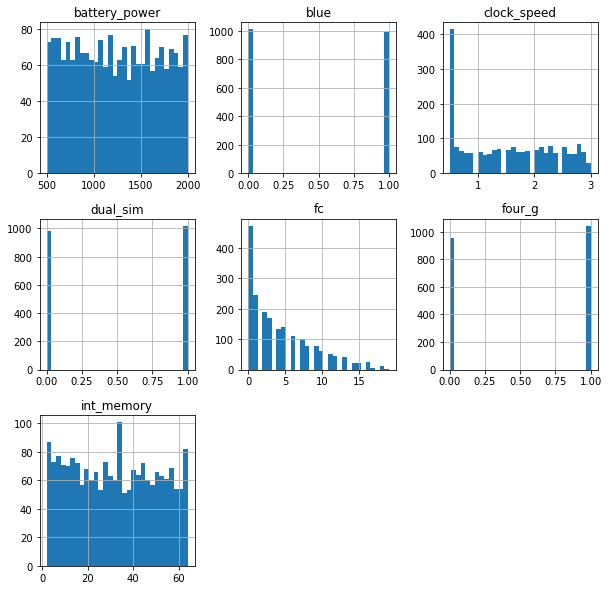

In [10]:
first_seven_var=dataset.iloc[:,0:7]
first_seven_var.hist(bins=30, figsize=(10,10))

In [11]:
first_seven_var.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000


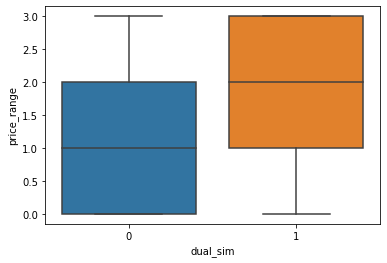

In [12]:
sns.boxplot(dataset['dual_sim'],dataset['price_range']) #dual_sim:Has dual sim support or not

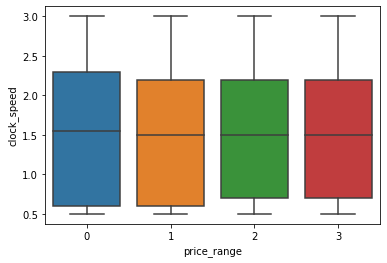

In [13]:
sns.boxplot(dataset['price_range'],dataset['clock_speed']) #clock_speed:speed at which microprocessor executes instructions

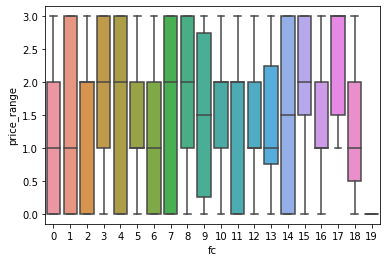

In [14]:
sns.boxplot(dataset['fc'],dataset['price_range']) #fc:Front Camera mega pixels
plt.show()

## The next seven Variables

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002BC35E8B640>,
      dtype=object)

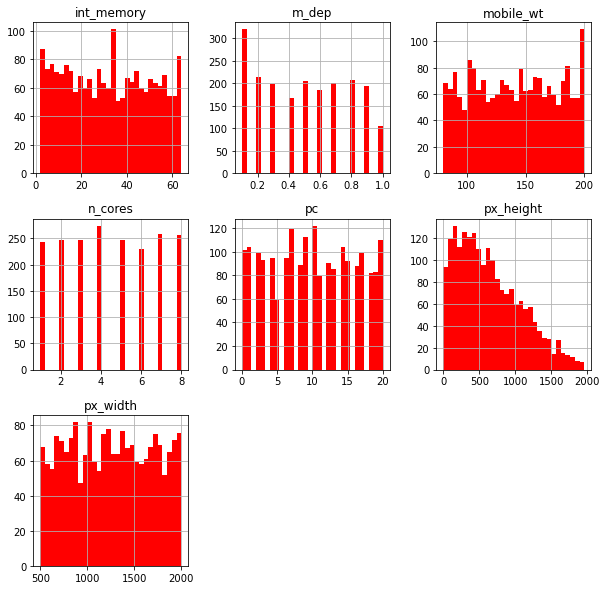

In [15]:
second_seven_var=dataset.iloc[:,6:13]
second_seven_var.hist(bins=30, figsize=(10,10), color ='r')

In [16]:
second_seven_var.describe()

,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,32.046500,0.501750,140.249000,4.520500,9.916500,645.108000,1251.515500
std,18.145715,0.288416,35.399655,2.287837,6.064315,443.780811,432.199447
min,2.000000,0.100000,80.000000,1.000000,0.000000,0.000000,500.000000
25%,16.000000,0.200000,109.000000,3.000000,5.000000,282.750000,874.750000
50%,32.000000,0.500000,141.000000,4.000000,10.000000,564.000000,1247.000000
75%,48.000000,0.800000,170.000000,7.000000,15.000000,947.250000,1633.000000
max,64.000000,1.000000,200.000000,8.000000,20.000000,1960.000000,1998.000000


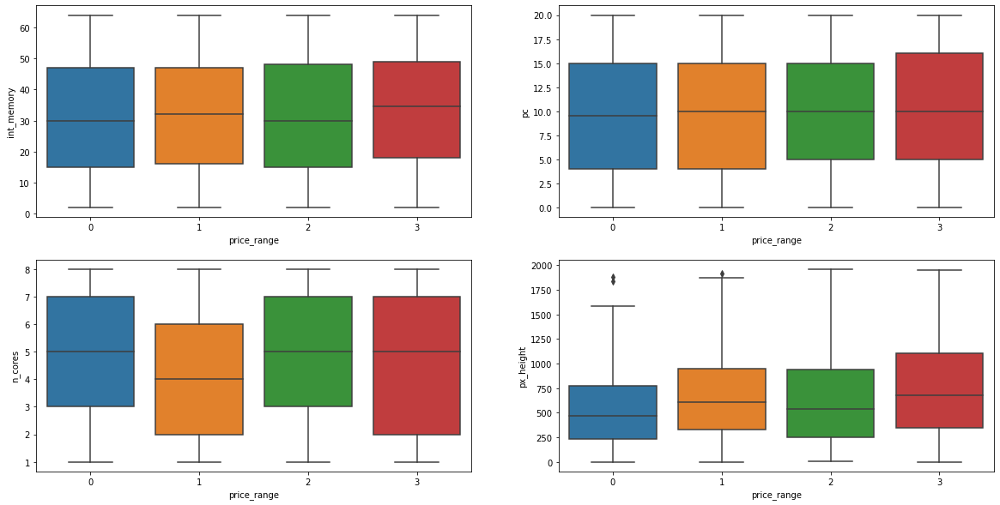

In [17]:
plt.figure(figsize=(20,10))
plt.subplot(221)
sns.boxplot(dataset['price_range'],dataset['int_memory'])
plt.subplot(222)
sns.boxplot(dataset['price_range'],dataset['pc'])
plt.subplot(223)
sns.boxplot(dataset['price_range'],dataset['n_cores'])
plt.subplot(224)
sns.boxplot(dataset['price_range'],dataset['px_height'])
plt.show()

## The Last Seven Variables


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002BC358AE940>,
      dtype=object)

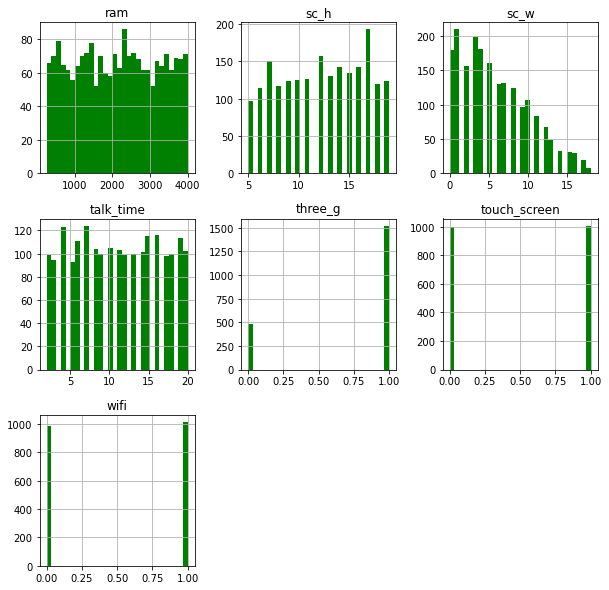

In [18]:
last_seven_var = dataset.iloc[:,13:20]
last_seven_var.hist(bins=30, figsize=(10,10), color ='green')

In [19]:
last_seven_var.describe()

,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000
std,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076
min,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000
25%,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000
50%,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000
75%,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000
max,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000


## Feature_Importance


* We get the feature importance of each feature of mobile phones dataset by using the feature importance property of the model.

* Feature importance gives a score for each feature of data, the higher the score more important or relevant is the feature towards output variable.

* Feature importance is an in-built class that comes with Tree Based Classifiers, but here in this example we use XGB Classifier for extracting the top 10 features for the dataset.

# Feature Selection

We decided to tackle the problem of identifying the important features from a set of given data and removing the irrelevant or less important features which do not contribute much to our decision making in order to achieve better accuracy for our model.

We aim that the feature selection will:
* reduce model complexity by dropping some irrelevant features.
* help ML algorithm to train a model faster.
* reduce dimensionality in order to avoid overfitting.

In this notebook we used 2 common techniques used for feature selection which are easy to implement and gave us good results based on problem:

1. **Feature Importance** 
2. **Correlation Matrix with Heatmap**

In [20]:
X = dataset.iloc[:,0:20]  #independent variables
y = dataset.iloc[:,-1]    #target variable i.e price range

In [21]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [22]:
import xgboost
import matplotlib.pyplot as plt

model = xgboost.XGBClassifier()
model.fit(X,y)

C:\Users\Asus\anaconda3\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=2, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

A trained XGBoost model automatically calculates feature importance on our predictive modeling problem.
These importance scores are available in the feature_importances_ member variable of the trained model.

In [23]:
print(model.feature_importances_) 

[0.14040743 0.0039343  0.01415134 0.01935592 0.01364646 0.00681664
 0.0171691  0.02244249 0.02557429 0.0226691  0.02293218 0.09682195
 0.08816101 0.4429328  0.01288087 0.01596808 0.01367627 0.00777803
 0.00664631 0.00603543]


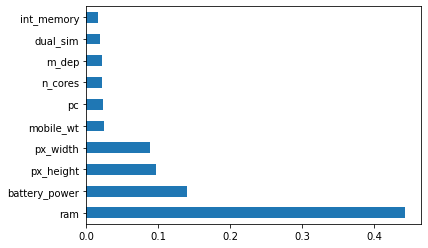

<Figure size 576x432 with 0 Axes>

In [24]:
# plot the graph of feature importances for better visualization 

feat_imp = pd.Series(model.feature_importances_, index=X.columns)
feat_imp.nlargest(10).plot(kind='barh') #we sort features before plotting

plt.figure(figsize=(8,6))
plt.show()

###  'ram' is the most important feature among all the features which is also true in practical scenario.

## Correlation Matrix

* Correlation will state how the features are related to each other or the target variable.


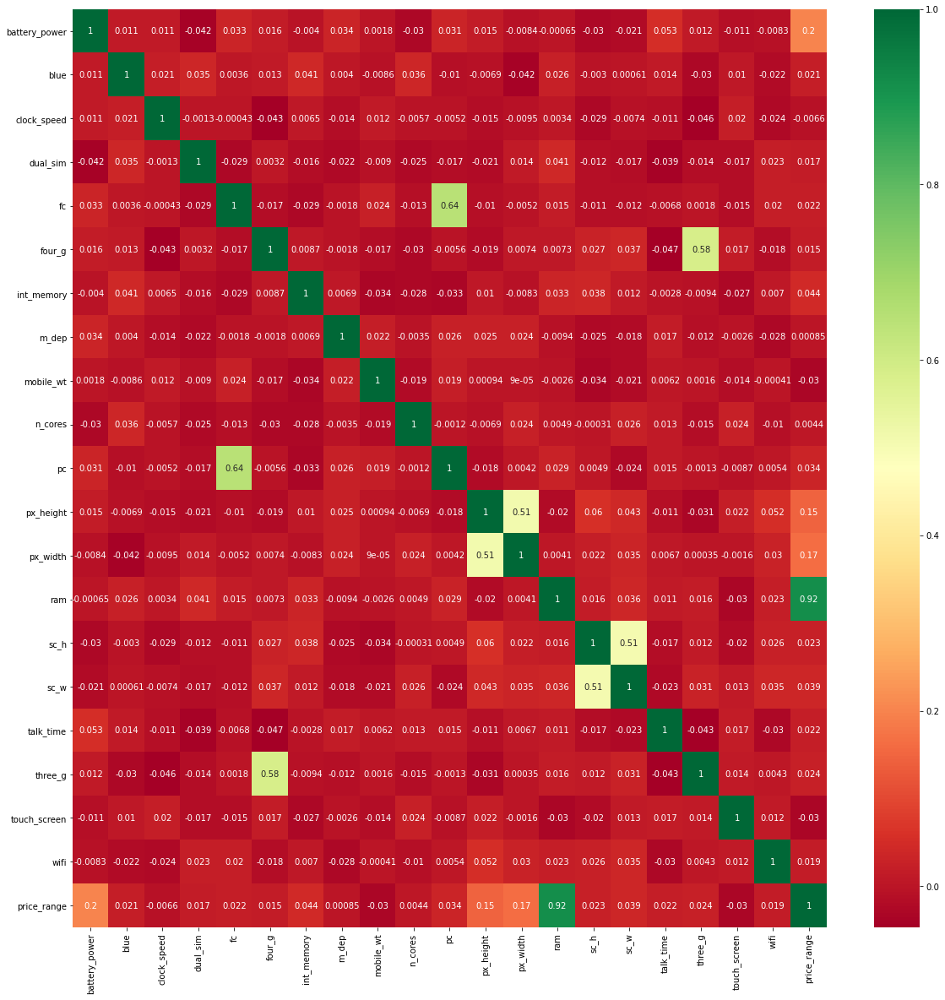

In [25]:
import seaborn as sns

#get correlations of each features in dataset
corrmat = dataset.corr()
top_corr_features = corrmat.index

plt.figure(figsize=(20,20))

#plot heat map
g=sns.heatmap(dataset[top_corr_features].corr(),annot=True,cmap="RdYlGn")

### From above correlation plot we conclude that the feature 'price_range' and 'ram' are highly correlated(0.92) features which can also be related with the present situation. As ram of  mobile phone increases, the price also gets higher. 

Let's make things more visible

In [26]:
# Most important feature

important_feature = corrmat['price_range'].sort_values(ascending=False).head(10).to_frame()
important_feature.head(5)

,price_range
price_range,1.000000
ram,0.917046
battery_power,0.200723
px_width,0.165818
px_height,0.148858


### visuals for comparing the correlation of ram and battery with price ranges

Text(0.5, 1.0, 'Correlation with battery')

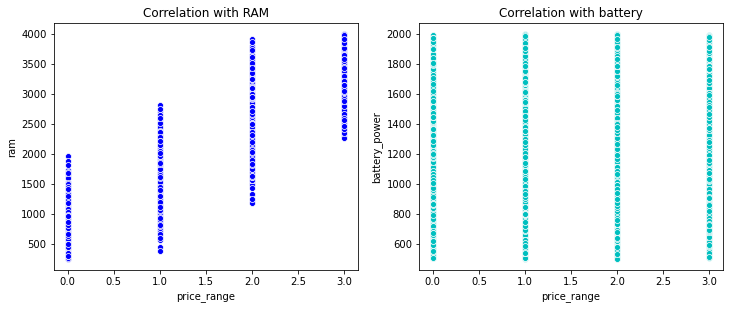

In [27]:
f = plt.figure(figsize=(12,10))

# correlation with ram
ax = f.add_subplot(2,2,1)
ax = sns.scatterplot(x="price_range", y="ram", color='b', data=dataset)
ax.set_title('Correlation with RAM')

# correlaion with Battery
ax = f.add_subplot(2,2,2)
ax = sns.scatterplot(x="price_range", y="battery_power", color='c', data=dataset)
ax.set_title('Correlation with battery')

## Data Visualization

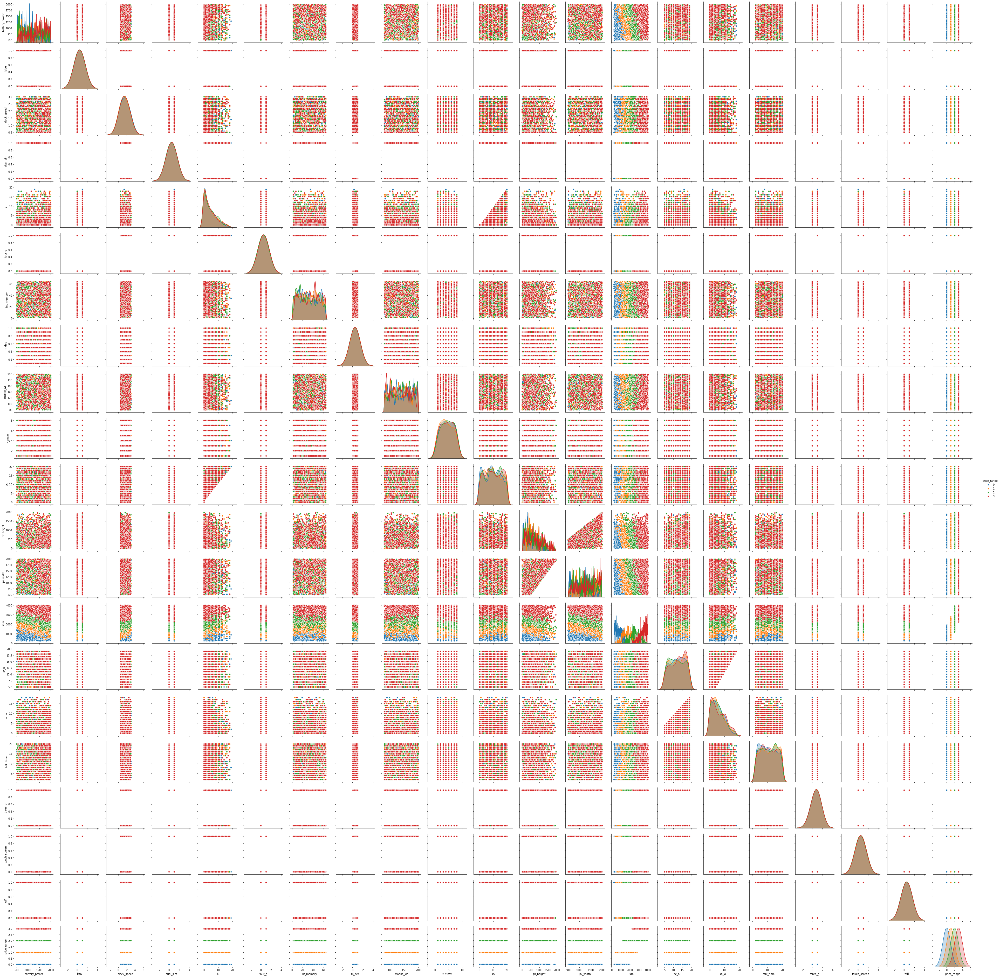

In [29]:
sns.pairplot(dataset,hue='price_range',diag_kws={'bw': 1})
plt.show(sns)

### How does ram is affected by price

#### The price of the phone increases when the size of its RAM is high, so we notice a positive correlation between the price of the phone and the size of its Ram.



In [ ]:
#this jointplot displays a relationship between ram and price range
#kind='kde' plots a kernel density estimate in the margins and converts the interior into a shaded countour plot

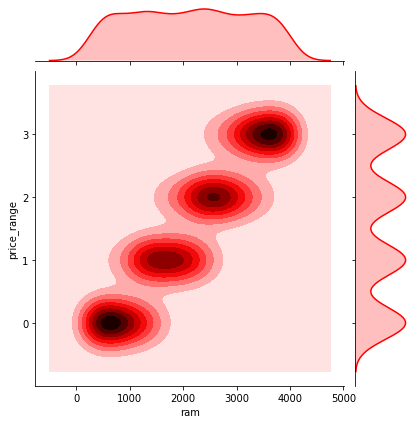

In [30]:
sns.jointplot(x='ram',y='price_range',data=dataset,color='red',kind='kde');

### Internal Memory vs Price Range

#### Visualizing real data over categorical data
##### Distribution of  internal memory in all price ranges 
mean of int_memory at price category - 0 is 31, mean of int_memory at price category- 1 is 32, mean of int_memory at price category 2 is slightly above 30, mean of int_memory at price category 3 is approximately 33.5 and 95% confidence intervals calculated using bootstrapping  

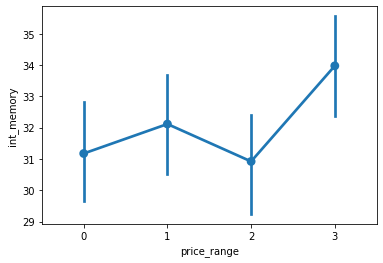

In [31]:
sns.pointplot(y="int_memory", x="price_range", data=dataset)

### % of Phones which support 3G

In [28]:
labels = ["3G-supported",'Not supported']
values=dataset['three_g'].value_counts().values

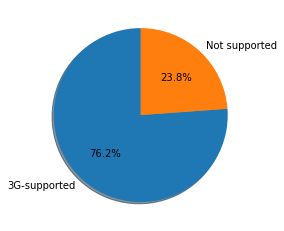

In [29]:
fig1, ax1 = plt.subplots()
ax1.pie(values, labels=labels, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()


### % of Phones which support 4G


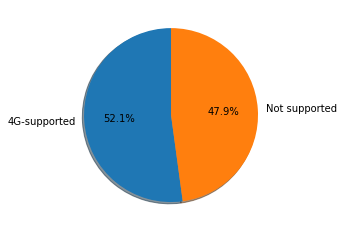

In [30]:
labels4g = ["4G-supported",'Not supported']
values4g = dataset['four_g'].value_counts().values
fig1, ax1 = plt.subplots()
ax1.pie(values4g, labels=labels4g, autopct='%1.1f%%',shadow=True,startangle=90)
plt.show()

### Battery power vs Price Range

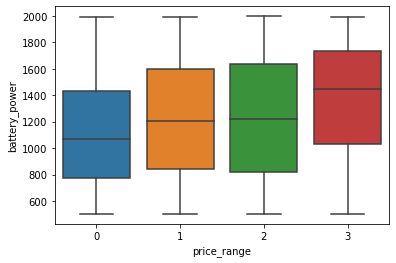

In [31]:
sns.boxplot(x="price_range", y="battery_power", data=dataset)

### No of Phones vs Camera megapixels of front and primary camera

Text(0.5, 0, 'MegaPixels')

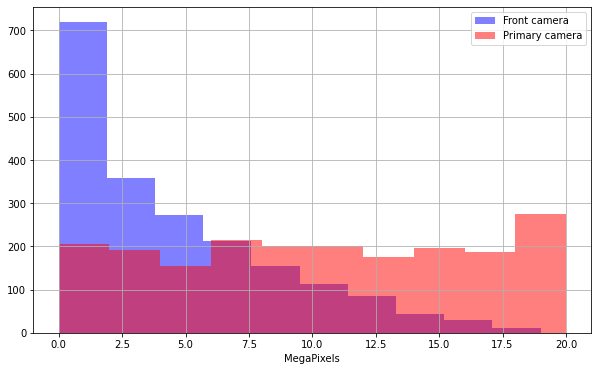

In [32]:
plt.figure(figsize=(10,6))
dataset['fc'].hist(alpha=0.5,color='blue',label='Front camera')
dataset['pc'].hist(alpha=0.5,color='red',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

### Mobile Weight vs Price range

In [17]:
#this jointplot displays a relationship between weight of mobile phone and price range
#kind='kde' plots a kernel density estimate in the margins and converts the interior into a shaded countour plot
#the plot is close to flat because we our variables are uncorrelated, as it was given in correlation matrix

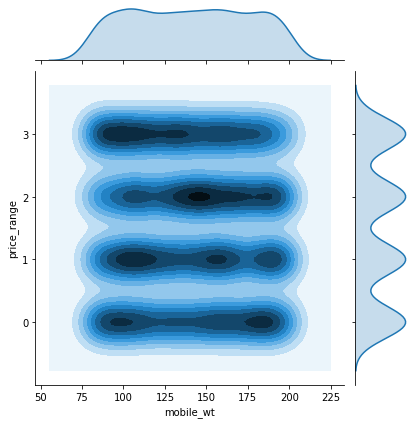

In [37]:
sns.jointplot(x='mobile_wt',y='price_range',data=dataset,kind='kde');

### Talk time vs Price range

#### Visualizing real data over categorical data
##### Distribution of  talk_time in all price ranges 

talk_time:longest time that a single battery charge will last when you are talking

mean of talk_time at price category - 0 is above 10.50, mean of talk_time at price category- 1 is 11.25, mean of talk_time at price category 2 is slightly below 11, mean of talk_time at price category 3 is approximately 11 and 95% confidence intervals are calculated using bootstrapping  



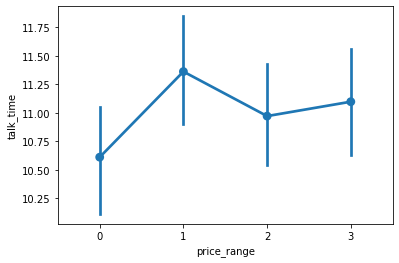

In [38]:
sns.pointplot(y="talk_time", x="price_range", data=dataset)

## Applying feature scaling


## X & Y array

In [33]:
X=dataset.drop('price_range',axis=1)

In [34]:
y=dataset['price_range']

In [35]:
X.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0


In [36]:
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [37]:
tc=test.columns

In [38]:
xc=X.columns

-Standardize features by removing the mean and scaling to unit variance

In [39]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X= sc.fit_transform(X)
test = sc.fit_transform(test)

In [40]:
test = pd.DataFrame(test, columns=tc)

In [41]:
X = pd.DataFrame(X, columns=xc)

In [42]:
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-1.730320,-0.475451,0.968496,0.312601,0.966559,2.108676,-0.974329,-1.581269,-1.487247,1.535535,...,0.976026,-0.926990,0.391912,1.229373,0.001158,0.397363,-1.653355,-1.760216,1.0,-1.014099
1,-1.726856,-0.942782,0.968496,-1.255832,0.966559,-0.132927,1.026347,1.509303,1.006341,1.478120,...,0.319433,0.274729,-0.871028,1.614643,-1.388231,-1.254383,-0.743418,0.568112,-1.0,-1.014099
2,-1.723391,1.292077,0.968496,1.519087,-1.034598,-0.805408,-0.974329,-0.367116,1.362567,1.334582,...,-0.993754,1.485693,0.287236,0.236313,1.158982,1.105254,-0.197456,-1.760216,1.0,0.986097
3,-1.719927,0.688249,-1.032529,-1.255832,0.966559,3.005317,1.026347,-0.477493,-0.062340,-1.249091,...,1.632619,-0.767532,1.165604,1.612804,-0.461972,-1.254383,-0.743418,0.568112,1.0,-1.014099
4,-1.716463,0.429135,-1.032529,-0.169994,-1.034598,1.436195,1.026347,0.847037,-0.062340,-0.904602,...,1.304323,0.281662,-0.977979,-0.336535,0.695852,0.633326,-0.743418,0.568112,-1.0,0.986097


In [43]:
X.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,-1.305750,-1.408949,-1.146784,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,-0.645989,0.585778,1.704465,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099
2,-1.537686,1.010051,-1.253064,0.981177,-0.532099,0.957886,0.493546,1.381165,0.134244,0.209639,-0.645989,1.392684,1.074968,0.441498,-0.310171,-0.864922,-0.368140,0.559641,0.994018,-1.014099
3,-1.419319,1.010051,1.198517,-1.019184,-0.992890,-1.043966,-1.215274,1.034357,-0.261339,0.646842,-0.151168,1.286750,1.236971,0.594569,0.876859,0.512708,-0.002014,0.559641,-1.006018,-1.014099
4,1.325906,1.010051,-0.395011,-1.019184,2.002254,0.957886,0.658915,0.340740,0.021220,-1.101971,0.673534,1.268718,-0.091452,-0.657666,-1.022389,-0.864922,0.730240,0.559641,0.994018,-1.014099


## Splitting the data

In [44]:
from sklearn.model_selection import train_test_split

To evaluate the classifier performance data is divided into Training set and test set 

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [46]:
print('X_train : ' + str(X_train.shape))
print('X_test : ' + str(X_test.shape))
print('y_train : ' + str(y_train.shape))
print('y_test : ' + str(y_test.shape))

X_train : (1400, 20)
X_test : (600, 20)
y_train : (1400,)
y_test : (600,)


# A presentation of 5 challenger models

## XGBOOST

In [47]:
import xgboost as xgb

In [48]:
# Instantiate the XGBClassifier: xg_cl
model = xgb.XGBClassifier(objective='multi:softmax', num_class=3, n_estimators=150, seed=101)

By default, XGBClassifier uses the objective='binary:logistic'. When one uses this objective, it employs either of these strategies: one-vs-rest (also known as one-vs-all) and one-vs-one.

When we use objective='multi:softprob', the output is a vector of number of data points * number of classes. As a result, there is an increase in time complexity of our code.

We decided to set objective=multi:softmax in our code. It is more apt for multi-class classification task.


In [49]:
model.fit(X_train, y_train)

C:\Users\Asus\anaconda3\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:23:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=150, n_jobs=2, num_class=3, num_parallel_tree=1,
              objective='multi:softprob', random_state=101, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, seed=101, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [50]:
preds = model.predict(X_test)

In [51]:
# Compute the accuracy: accuracy
accuracy = float(np.sum(preds==y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy))

accuracy: 0.916667


#### predict the data on train&test data.

In [52]:
predicted_value = model.predict(X_test)
actual_value = y

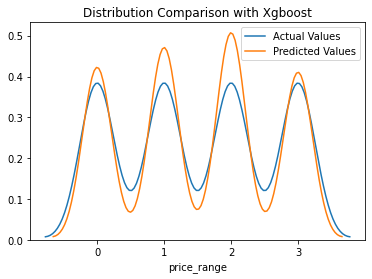

In [53]:
## Comparison of distributions in Train data

sns.distplot(actual_value, hist=False, label="Actual Values")
sns.distplot(predicted_value, hist=False, label="Predicted Values")
plt.title('Distribution Comparison with Xgboost')
plt.show()

## - A presentation of the initial model to be used as a benchmark

## Benchmark_Logistic_Regression_Model

In [54]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report
#from sklearn.metrics import plot_confusion_matrix

model = LogisticRegression()
model.fit(X_train,y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

#Accuracy: The amount of correct classifications over the total amount of classifications.
#The train accuracy: The accuracy of a model on examples it was constructed on.
#The test accuracy is the accuracy of a model on examples it hasn't seen.
#Confusion matrix: A tabulation of the predicted class  against the actual class
#We use the data of the confusion matrix to compute metrics that quantify the performance of the model.

print("Train Set Accuracy:"+str(accuracy_score(y_train_pred,y_train)*100))
print("Test Set Accuracy:"+str(accuracy_score(y_test_pred,y_test)*100))
print("\nConfusion Matrix:\n%s"%confusion_matrix(y_test_pred,y_test))
print("\nClassification Report:\n%s"%classification_report(y_test_pred,y_test))



Train Set Accuracy:97.78571428571429
Test Set Accuracy:94.5

Confusion Matrix:
[[140   4   0   0]
 [  4 135  12   0]
 [  0   2 158   3]
 [  0   0   8 134]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       144
           1       0.96      0.89      0.92       151
           2       0.89      0.97      0.93       163
           3       0.98      0.94      0.96       142

    accuracy                           0.94       600
   macro avg       0.95      0.94      0.95       600
weighted avg       0.95      0.94      0.95       600



In [67]:
'''The values returned by the confusion matrix are divided into the following categories:
True Positive (TP):
The model predicted positive, and the real value is positive.
True Negative (TN):
The model predicted negative, and the real value is negative.
False Positive (FP):
The model predicted positive, but the real value is negative (Type I error).
False Negative (FN):
The model predicted negative, but the real value is positive (Type II error).'''

'The values returned by the confusion matrix are divided into the following categories:\nTrue Positive (TP):\nThe model predicted positive, and the real value is positive.\nTrue Negative (TN):\nThe model predicted negative, and the real value is negative.\nFalse Positive (FP):\nThe model predicted positive, but the real value is negative (Type I error).\nFalse Negative (FN):\nThe model predicted negative, but the real value is positive (Type II error).'

## Criteria

## - A presentation of the criteria chosen to select a model over another

We can see from Train Set accuracy and Test Set accuracy scores(>90%) that there is no overfitting

Metrics for the evaluation of a classification model:

**Accuracy**:

The accuracy returns the proportion of correct predictions.
Accuracy = (TP + TN)/(TP + TN + FP + FN) 

**Precision**:

The precision returns the proportion of true positives among all the values predicted as positive.
Precision = TP/(TP + FP)

**Recall**:

The recall returns the proportion of positive values correctly predicted.
Recall = TP/(TP + FN)

**F1-score**:

The f1-score is the harmonic mean of precision and recall.
F1-score = (2 x Precision x Recall)/(Precision + Recall)

**Support**: number of observations for each class

**Macro average**:
the arithmetic average of a metric between the 4 classes.

**Weighted average**:

the weighted average is calculated by dividing sum(metric of interest x weight) by sum(weights).
Here the weights are the number of observation for each class.

#### The model correctly predicted 97% the observations of class 0, so both precision and recall are 0.97, and the F1-score is 0.97.
#### For class 2, the recall is higher than precision, which means that there are fewer FN than FP
#### For class 1 and 3, precision is higher than recall, which means that there are more FN than FP

#### We know that no metric is good enough to evaluate all classification problems, but that each metric is the best choice in specific circumstances. We use Accuracy for evaluating a classification model because of its extensive use when there is Class balance.(however, it can be misleading when the classes are unbalanced.)





[[140   4   0   0]
 [  4 135  12   0]
 [  0   2 158   3]
 [  0   0   8 134]]


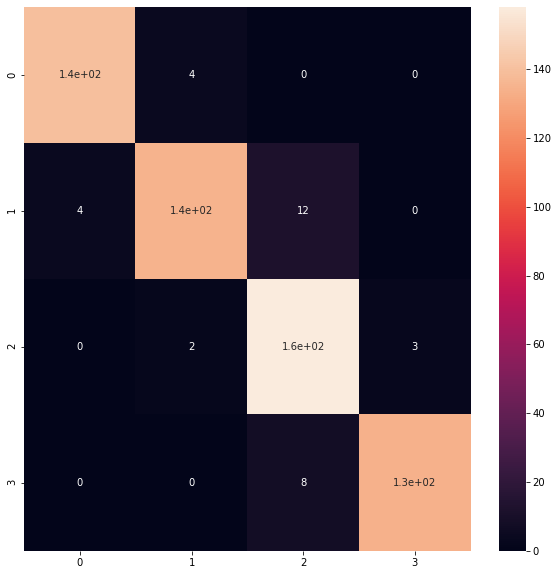

In [55]:
matrix1=confusion_matrix(y_test_pred,y_test)
print(matrix1)
plt.figure(figsize = (10,10))
sns.heatmap(matrix1,annot=True)

The rows of the matrix represent the real classes, while the columns represent the predicted classes.
The diagonal from the top left to the bottom right contains the observations correctly predicted.

### Among all the classifiers we choose Logistic Regression Model as it has the highest accuracy.

## predict the price range in test data

In [56]:
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-1.730320,-0.475451,0.968496,0.312601,0.966559,2.108676,-0.974329,-1.581269,-1.487247,1.535535,...,0.976026,-0.926990,0.391912,1.229373,0.001158,0.397363,-1.653355,-1.760216,1.0,-1.014099
1,-1.726856,-0.942782,0.968496,-1.255832,0.966559,-0.132927,1.026347,1.509303,1.006341,1.478120,...,0.319433,0.274729,-0.871028,1.614643,-1.388231,-1.254383,-0.743418,0.568112,-1.0,-1.014099
2,-1.723391,1.292077,0.968496,1.519087,-1.034598,-0.805408,-0.974329,-0.367116,1.362567,1.334582,...,-0.993754,1.485693,0.287236,0.236313,1.158982,1.105254,-0.197456,-1.760216,1.0,0.986097
3,-1.719927,0.688249,-1.032529,-1.255832,0.966559,3.005317,1.026347,-0.477493,-0.062340,-1.249091,...,1.632619,-0.767532,1.165604,1.612804,-0.461972,-1.254383,-0.743418,0.568112,1.0,-1.014099
4,-1.716463,0.429135,-1.032529,-0.169994,-1.034598,1.436195,1.026347,0.847037,-0.062340,-0.904602,...,1.304323,0.281662,-0.977979,-0.336535,0.695852,0.633326,-0.743418,0.568112,-1.0,0.986097


In [57]:
x2 = test.drop('id', axis=1)

In [58]:
x2.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-0.475451,0.968496,0.312601,0.966559,2.108676,-0.974329,-1.581269,-1.487247,1.535535,-0.580671,0.976026,-0.926990,0.391912,1.229373,0.001158,0.397363,-1.653355,-1.760216,1.0,-1.014099
1,-0.942782,0.968496,-1.255832,0.966559,-0.132927,1.026347,1.509303,1.006341,1.478120,0.293833,0.319433,0.274729,-0.871028,1.614643,-1.388231,-1.254383,-0.743418,0.568112,-1.0,-1.014099
2,1.292077,0.968496,1.519087,-1.034598,-0.805408,-0.974329,-0.367116,1.362567,1.334582,-0.580671,-0.993754,1.485693,0.287236,0.236313,1.158982,1.105254,-0.197456,-1.760216,1.0,0.986097
3,0.688249,-1.032529,-1.255832,0.966559,3.005317,1.026347,-0.477493,-0.062340,-1.249091,1.605590,1.632619,-0.767532,1.165604,1.612804,-0.461972,-1.254383,-0.743418,0.568112,1.0,-1.014099
4,0.429135,-1.032529,-0.169994,-1.034598,1.436195,1.026347,0.847037,-0.062340,-0.904602,0.731085,1.304323,0.281662,-0.977979,-0.336535,0.695852,0.633326,-0.743418,0.568112,-1.0,0.986097


In [59]:
predicted_test_value = model.predict(x2)
pd.value_counts(predicted_test_value) #we have value count on every unique value on predicted test price range

0    261
3    258
2    250
1    231
dtype: int64

##### This is almost evenly distributed, but the phone with a very low cost  is dominating over the others. By specifying economic range a good product can be suggested to a costumer.

#### More sophisticated artificial intelligence techniques(The Back-propagation Training Algorithm- 96.31% accuracy-<a href="https://philarchive.org/archive/KHIAFP" target="_blank">see article</a>) can be used to maximize the accuracy and predict the accurate price of the mobile phones. To achieve maximum accuracy and predict more accurate, more and more instances should be added to the data set. And selecting more appropriate features can also increase the accuracy. So dataset should be large and more appropriate features should be selected to achieve higher accuracy. 

### Adding Predicted price to test.csv

In [60]:
test['price_range']=predicted_test_value

## Gradient_Boosting

In [61]:
from sklearn.ensemble import GradientBoostingClassifier

model = GradientBoostingClassifier()
model.fit(X_train,y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


print("Train Set Accuracy:"+str(accuracy_score(y_train_pred,y_train)*100))
print("Test Set Accuracy:"+str(accuracy_score(y_test_pred,y_test)*100))
print("\nConfusion Matrix:\n%s"%confusion_matrix(y_test_pred,y_test))
print("\nClassificationReport:\n%s"%classification_report(y_test_pred,y_test))

Train Set Accuracy:100.0
Test Set Accuracy:89.83333333333333

Confusion Matrix:
[[135  10   0   0]
 [  9 127  17   0]
 [  0   4 152  12]
 [  0   0   9 125]]

ClassificationReport:
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       145
           1       0.90      0.83      0.86       153
           2       0.85      0.90      0.88       168
           3       0.91      0.93      0.92       134

    accuracy                           0.90       600
   macro avg       0.90      0.90      0.90       600
weighted avg       0.90      0.90      0.90       600



#### Compared to the output of metric(0.94) given in Logistic Regression, model accuracy(0.90) of Gradient Boosing model is lower. This phenomenon can be observed while comparing the number of correctly predicted observations given in diagonal of confusion matrix

[[135  10   0   0]
 [  9 127  17   0]
 [  0   4 152  12]
 [  0   0   9 125]]


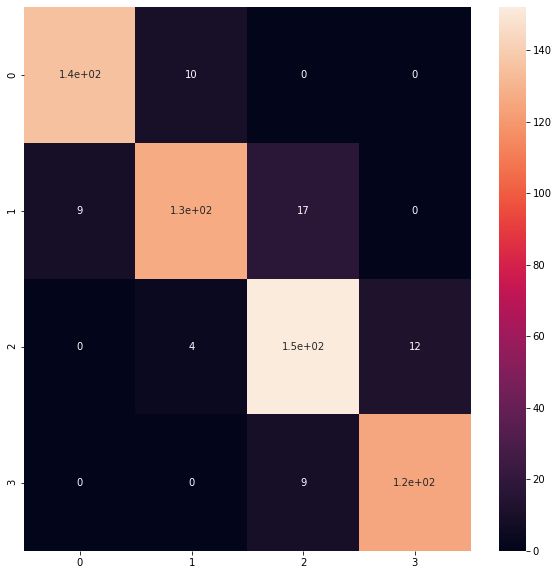

In [62]:
matrix2=confusion_matrix(y_test_pred,y_test)
print(matrix2)
plt.figure(figsize = (10,10))
sns.heatmap(matrix2,annot=True)

## Building_Decision_Tree_Model

In [63]:
# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.tree import DecisionTreeClassifier
# Create Decision Tree classifer object
DTree = DecisionTreeClassifier()

# Train Decision Tree Classifer
DTree = DTree.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = DTree.predict(X_test)

## Evaluating Model

In [64]:
# Model Accuracy, how often is the classifier correct?
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8233333333333334


In [65]:
print(pd.crosstab(y_test, y_pred, rownames=['Labels rééls'], colnames=['Predictions']))

Predictions     0    1    2    3
Labels rééls                    
0             131   13    0    0
1              14  110   17    0
2               0   26  134   18
3               0    1   17  119


## Visualizing Decision Trees

In [74]:
!pip install graphviz
!pip install pydotplus

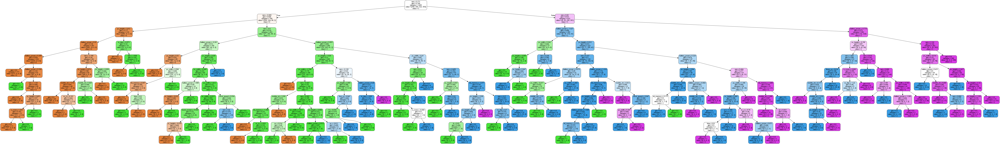

In [75]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

feature_cols = ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi']
dot_data = StringIO()
export_graphviz(DTree , out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2','3'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

graph.write_png('DecisionTree.png')
Image(graph.create_png())

In the decision tree chart, each internal node has a decision rule that splits the data. Gini referred as Gini ratio, which measures the impurity of the node. You can say a node is pure when all of its records belong to the same class, such nodes known as the leaf node.

#### Here, the resultant tree is unpruned. This unpruned tree is unexplainable and not easy to understand. In the next section, let's optimize it by pruning.

## Optimizing Decision Tree Performance

In [66]:
# Splitting the data
X=dataset.drop('price_range',axis=1)
y=dataset['price_range']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Create Decision Tree classifer object
ODTree = DecisionTreeClassifier(criterion="entropy", max_depth=6)

# Train Decision Tree Classifer
ODTree = ODTree.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = ODTree.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8516666666666667


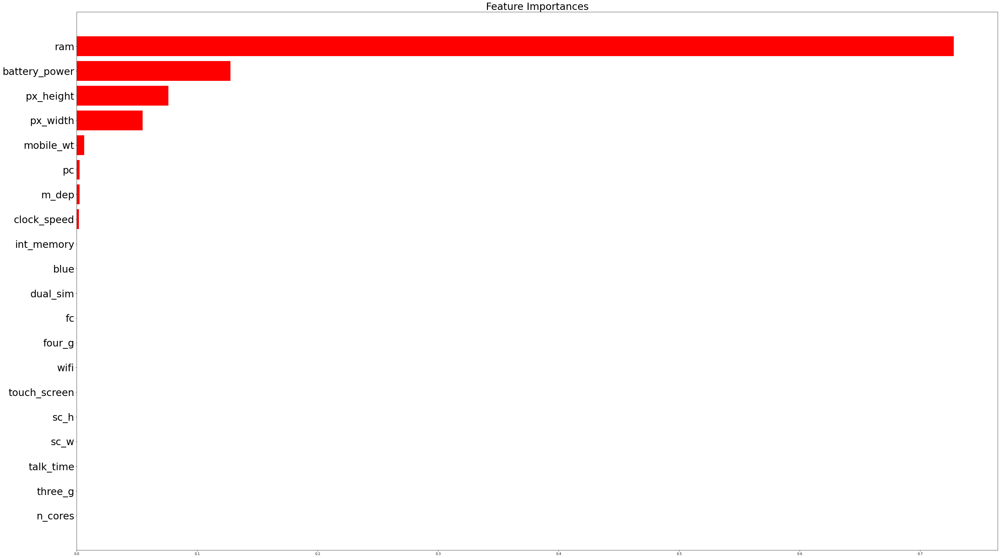

In [67]:
features = X_train.columns.values
importances = ODTree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(50,30))
plt.title('Feature Importances', fontsize = 30)
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), features[indices],fontsize=30)
plt.show()

## Visualizing Decision Trees

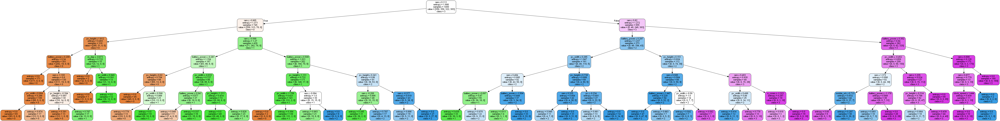

In [78]:
dot_data = StringIO()
export_graphviz(ODTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1','2','3'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('OptimizingDecisionTree.png')
Image(graph.create_png())

This pruned model is less complex, explainable, and easy to understand than the previous decision tree model plot.

## Random_Tree_Model

In [81]:
'''from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)'''


'from sklearn.preprocessing import StandardScaler\nsc = StandardScaler()\nX_train = sc.fit_transform(X_train)\nX_test = sc.transform(X_test)'

In [68]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_pred = np.round(regressor.predict(X_test))


In [69]:
regressor.score(X_test,y_test)

0.9297752940515434

In [70]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test,y_pred))

[[134  10   0   0]
 [ 10 121  10   0]
 [  0  16 154   8]
 [  0   0  17 120]]


In [71]:
print(classification_report(y_test,y_pred))
print(accuracy_score(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       144
           1       0.82      0.86      0.84       141
           2       0.85      0.87      0.86       178
           3       0.94      0.88      0.91       137

    accuracy                           0.88       600
   macro avg       0.89      0.88      0.88       600
weighted avg       0.88      0.88      0.88       600

0.8816666666666667


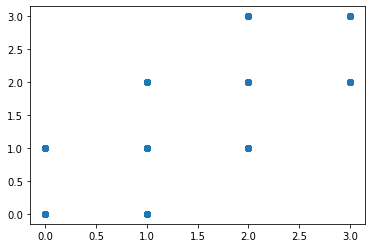

In [72]:
plt.scatter(y_test,y_pred)


#### In feature extraction we are interested in finding a new set of k dimensions that are combinations of the original d dimensions  

### a dimension reduction algorithm - PCA was applied to identify an impact on performance of algorithm which performed best. However, PCA was unhelpful for this target.

## PCA

In [73]:
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

In [74]:
pca = PCA()
pca.fit(scale(dataset[dataset.columns[:20]])) 
# it is necessary to normalize data before performing PCA. 
#The PCA calculates a new projection of data set. And the new axis are based on the standard deviation of variables.

PCA()

In [75]:
print(pca.explained_variance_) #parameter returns a vector of the variance explained by each dimension.
print(pca.explained_variance_ratio_)


[1.67809669 1.62330659 1.58336253 1.42975987 1.12207212 1.08768022
 1.06617731 1.02092877 1.0175506  1.00618845 0.9812144  0.97531969
 0.95271479 0.95212529 0.89928323 0.87655734 0.50105488 0.47253596
 0.41304483 0.35103144]
[0.08386288 0.08112475 0.07912854 0.07145225 0.05607555 0.05435682
 0.05328221 0.05102092 0.05085209 0.05028427 0.04903619 0.0487416
 0.04761192 0.04758246 0.04494168 0.04380595 0.02504022 0.02361498
 0.02064192 0.0175428 ]


### Visuals

In [76]:
eig = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(20)], 
        "explained_variance" : pca.explained_variance_,
        "% explained_variance" : np.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. explained" : np.round(np.cumsum(pca.explained_variance_ratio_) * 100)
    },
    columns = ["Dimension", "explained_variance", "% explained_variance", "% cum. var. explained"]
)

Text(0.5, 0.98, 'explained variance by dim')

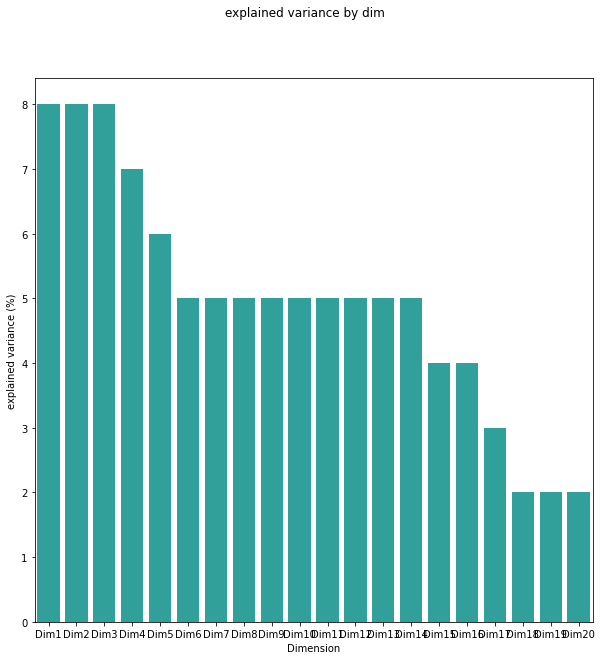

In [77]:
plt.figure(figsize=(10,10))

g_eig = sns.barplot(x = "Dimension", 
                y = "% explained_variance",
                palette = ["lightseagreen"],
                data = eig)
g_eig.set(ylabel = "explained variance (%)")
g_eig.figure.suptitle("explained variance by dim")



In [78]:
dataset_pca = pca.transform(dataset[dataset.columns[:20]])

dataset_pca_df = pd.DataFrame({
    "Dim1" : dataset_pca[:,0], 
    "Dim2" : dataset_pca[:,1],
    "Price_Range" : dataset.price_range
})

dataset_pca_df.head() # transformed the original dataset into the one with 2 features only

,Dim1,Dim2,Price_Range
0,-21.598168,255.596092,1
1,-348.048492,443.836189,2
2,-396.081390,426.138947,2
3,-394.285273,444.224888,2
4,-212.851802,349.525023,1


Text(0.5, 0.98, 'First PCA')

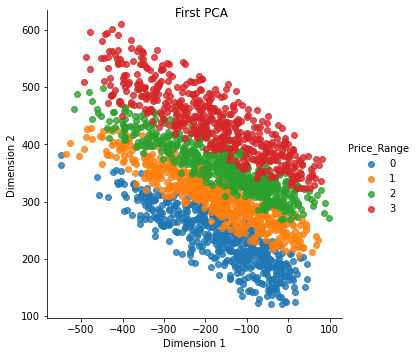

In [79]:
g_pca = sns.lmplot("Dim1", "Dim2", hue = "Price_Range", data = dataset_pca_df, fit_reg = False)
g_pca.set(xlabel = "Dimension 1", ylabel = "Dimension 2 ")
g_pca.fig.suptitle("First PCA")


In [80]:
X=dataset_pca_df.drop('Price_Range',axis=1)
y=dataset_pca_df['Price_Range']

In [81]:
#from sklearn.preprocessing import StandardScaler
xc=X.columns
sc = StandardScaler()
X = sc.fit_transform(X)
X = pd.DataFrame(X, columns=xc)
X.head()

,Dim1,Dim2
0,1.206246,-0.887047
1,-1.387470,1.170561
2,-1.769101,0.977116
3,-1.754831,1.174809
4,-0.313304,0.139668


In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [83]:
import xgboost as xgb
# Instantiate the XGBClassifier: xg_cl
model = xgb.XGBClassifier(objective='multi:softmax', num_class=3, n_estimators=150, seed=123)
model.fit(X_train, y_train)
preds = model.predict(X_test)
from sklearn.metrics import accuracy_score
# Compute the accuracy: accuracy
accuracy = float(np.sum(preds==y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy))

C:\Users\Asus\anaconda3\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy: 0.878333


## OR

In [84]:
dataset_pca = pca.transform(dataset[dataset.columns[:20]])

dataset_pca_df = pd.DataFrame({
    "Dim1" : dataset_pca[:,0], 
    "Dim2" : dataset_pca[:,1],
    "Dim3" : dataset_pca[:,2],
    "Price_Range" : dataset.price_range
})

dataset_pca_df.head() ## transformed the original dataset into the one with 3 features only

,Dim1,Dim2,Dim3,Price_Range
0,-21.598168,255.596092,398.150878,1
1,-348.048492,443.836189,1458.101646,2
2,-396.081390,426.138947,1517.124060,2
3,-394.285273,444.224888,1531.707108,2
4,-212.851802,349.525023,1204.245565,1


In [85]:
X=dataset_pca_df.drop('Price_Range',axis=1)
y=dataset_pca_df['Price_Range']

In [86]:
#from sklearn.preprocessing import StandardScaler
xc=X.columns
sc = StandardScaler()
X = sc.fit_transform(X)
X = pd.DataFrame(X, columns=xc)
X.head()

,Dim1,Dim2,Dim3
0,1.206246,-0.887047,-1.447204
1,-1.387470,1.170561,1.315197
2,-1.769101,0.977116,1.469019
3,-1.754831,1.174809,1.507025
4,-0.313304,0.139668,0.653608


In [87]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

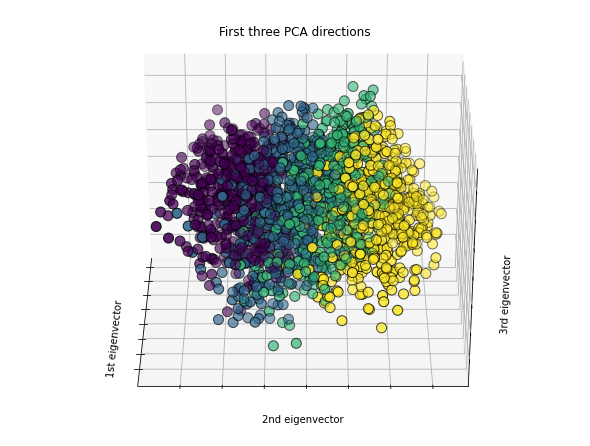

In [88]:
fig = plt.figure(2, figsize=(8, 6))
ax2 = Axes3D(fig, elev=-150, azim=180)
X_reduced = PCA(n_components=3).fit_transform(X)
ax2.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y, edgecolor='k', s=100)
ax2.set_title("First three PCA directions")
ax2.set_xlabel("1st eigenvector")
ax2.w_xaxis.set_ticklabels([])
ax2.set_ylabel("2nd eigenvector")
ax2.w_yaxis.set_ticklabels([])
ax2.set_zlabel("3rd eigenvector")
ax2.w_zaxis.set_ticklabels([])

plt.show()


In [89]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

### XGBoost

In [90]:
import xgboost as xgb
# Instantiate the XGBClassifier: xg_cl
model = xgb.XGBClassifier(objective='multi:softmax', num_class=3, n_estimators=150, seed=123)
model.fit(X_train, y_train)
preds = model.predict(X_test)
from sklearn.metrics import accuracy_score
# Compute the accuracy: accuracy
accuracy = float(np.sum(preds==y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy))

C:\Users\Asus\anaconda3\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
accuracy: 0.908333


#####  Slightly Lower than the score without PCA

#### Logistic Regression

In [91]:
#from sklearn.linear_model import LogisticRegression
#from sklearn.metrics import accuracy_score
#from sklearn.metrics import confusion_matrix,classification_report
#from sklearn.metrics import plot_confusion_matrix

model = LogisticRegression()
model.fit(X_train,y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)


print("Train Set Accuracy:"+str(accuracy_score(y_train_pred,y_train)*100))
print("Test Set Accuracy:"+str(accuracy_score(y_test_pred,y_test)*100))
print("\nConfusion Matrix:\n%s"%confusion_matrix(y_test_pred,y_test))
print("\nClassification Report:\n%s"%classification_report(y_test_pred,y_test))



Train Set Accuracy:91.14285714285715
Test Set Accuracy:90.5

Confusion Matrix:
[[138  10   0   0]
 [  6 123  14   0]
 [  0   8 154   9]
 [  0   0  10 128]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95       148
           1       0.87      0.86      0.87       143
           2       0.87      0.90      0.88       171
           3       0.93      0.93      0.93       138

    accuracy                           0.91       600
   macro avg       0.91      0.91      0.91       600
weighted avg       0.91      0.91      0.91       600



##### Accuracy score is lower than the case without PCA implementation

#### Other feature extraction algorithms such as Forward selection and backward selection could be used to reduce dimensions.